# Тренировка модели и вспомогательных коэффициентов

## Подготовка


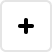
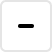
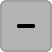
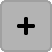
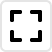
...
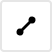
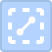
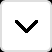
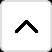
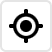

In [1]:
import pandas as pd
from sklearn.metrics import mean_squared_error as error_metric

from lets_plot import *
from lets_plot.mapping import as_discrete
LetsPlot.setup_html()

import os; import sys; sys.path.append(os.path.join(sys.path[0], ".."))
from util import util as u
from util import font as ufont
from util import clustering_model as ucm
from util import transform_data as utd

In [2]:
N_CLUSTERS = 7
N_CLUSTERS_MIN, N_CLUSTERS_MAX = 6, 9

In [3]:
def get_clusters_s(s, n_clusters, *, name="cluster", random_state=42):
    from sklearn.cluster import KMeans

    return pd.Series(
        KMeans(n_clusters=n_clusters, random_state=random_state).fit(s.to_frame()).labels_,
        name=name,
        index=s.index
    )

def get_clusters_widths(clusters_s, widths_s, *, name="cluster_width"):
    df = pd.concat([clusters_s, widths_s], axis="columns")
    width_s = []
    for cluster in clusters_s.unique():
        cluster_df = df[df[clusters_s.name] == cluster]
        cluster_width = cluster_df.width.sum() / cluster_df.shape[0]
        width_s.append(pd.Series(
            [cluster_width] * cluster_df.shape[0],
            name=name,
            index=cluster_df.index
        ))
    return pd.concat(width_s)

def append_clusters(df, n_clusters, *, clustering_col="width"):
    df = df.assign(cluster=get_clusters_s(df[clustering_col], n_clusters))
    df = df.assign(cluster_width=get_clusters_widths(df.cluster, df[clustering_col]))
    cluster_ids = {
        df[df.cluster_width == cluster_width].iloc[0].cluster: i
        for i, cluster_width in enumerate(sorted(df.cluster_width.unique()))
    }
    df.cluster = df.cluster.replace(cluster_ids)
    return df

def get_predictor(char_widths_df, n_clusters):
    char_widths_with_clusters_df = pd.concat([
        append_clusters(char_widths_df[char_widths_df.font_family == font_family], n_clusters)
        for font_family in char_widths_df.font_family.unique()
    ], ignore_index=True)
    clustering_s = char_widths_with_clusters_df.groupby(["char", "alphabet"]).cluster.mean().round().astype(int)
    cluster_widths_s = char_widths_with_clusters_df.groupby("cluster").cluster_width.mean()
    return pd.concat([
        clustering_s,
        clustering_s.replace(cluster_widths_s).rename("cluster_width")
    ], axis="columns").reset_index(level=1)

def get_coefficients_s(df, target_col, *,
                       additive=True,
                       predicted_col="predicted_width", coeff_col="coeff", width_col="width", size_col="symbols_count"):
    import numpy as np

    if additive:
        df[coeff_col] = (df[width_col] - df[predicted_col]) / df[size_col]
        return df.groupby(target_col)[coeff_col].mean()
    else:
        df = df.assign(
            numerator=df[width_col] * df[predicted_col] / df[size_col].pow(2),
            denominator=df[predicted_col].pow(2) / df[size_col].pow(2)
        )
        grouped_df = df.groupby(target_col).agg({"numerator": ["sum"], "denominator": ["sum"]})
        return (grouped_df.numerator / grouped_df.denominator)["sum"].rename(coeff_col)

In [4]:
full_char_widths_df = u.read_data("../data/full/char_widths.csv", monospaced=False)

char_widths_df = utd.filter_by_font(full_char_widths_df, filters=["size", "face"])
char_widths_df = utd.narrow_by_column(char_widths_df, "font_family", values=ufont.TRAIN_FONT_FAMILIES)

print(char_widths_df.shape)
char_widths_df

(4944, 5)


,char_id,char,alphabet,font_family,width
0,32,,latin,Geneva,5
1,33,!,latin,Geneva,6
2,34,"""",latin,Geneva,7
3,35,#,latin,Geneva,11
4,36,$,latin,Geneva,11
...,...,...,...,...,...
4939,1323,ԫ,cyrillic,Verdana,19
4940,1324,Ԭ,cyrillic,Verdana,19
4941,1325,ԭ,cyrillic,Verdana,19
4942,1326,Ԯ,cyrillic,Verdana,19


In [5]:
full_control_df = u.read_data("../data/full/control.csv", monospaced=False)

control_df = utd.narrow_by_column(full_control_df, "font_family", values=ufont.TRAIN_FONT_FAMILIES)
train_control_df, test_control_df = utd.train_test_split_by_column(control_df, "text")

print(control_df.shape)
control_df

(145296, 7)


,text,width,alphabet,font_family,font_size,font_face,symbols_count
0,x,5,latin,Geneva,9,normal,1
1,y,5,latin,Geneva,9,normal,1
2,z,5,latin,Geneva,9,normal,1
3,0,7,latin,Geneva,9,normal,1
4,1,7,latin,Geneva,9,normal,1
...,...,...,...,...,...,...,...
145291,Правление рот человечек мелькнуть,579,cyrillic,Verdana,20,bold+italic,33
145292,Дыхание означать горький выбирать,590,cyrillic,Verdana,20,bold+italic,33
145293,Металл назначить ложиться подземный,629,cyrillic,Verdana,20,bold+italic,35
145294,Металл поставить провинция разводить,630,cyrillic,Verdana,20,bold+italic,36


## Вычисление оптимального числа кластеров

In [6]:
clusters_train_df = utd.filter_by_font(train_control_df, filters=["size", "face"])
clusters_df = pd.DataFrame(columns=["n_clusters", "score"])
for n_clusters in range(N_CLUSTERS_MIN, N_CLUSTERS_MAX + 1):
    predictor_df = get_predictor(char_widths_df, n_clusters)
    clusters_df = pd.concat([clusters_df, pd.DataFrame({
        "n_clusters": [n_clusters],
        "score": [error_metric(clusters_train_df.width, ucm.predict(clusters_train_df.text, predictor_df))],
    })], ignore_index=True)
print(clusters_df.shape)
clusters_df

(4, 2)


,n_clusters,score
0,6,166.552939
1,7,126.519291
2,8,126.526021
3,9,123.290938


In [7]:
ggplot(clusters_df) + \
    geom_bar(aes(x="n_clusters", y="score"), stat='identity') + \
    scale_x_continuous(breaks=list(range(N_CLUSTERS_MIN, N_CLUSTERS_MAX + 1)))

## Тренировка модели

In [8]:
predictor_df = get_predictor(char_widths_df, N_CLUSTERS)
print(predictor_df.shape)
predictor_df

(824, 3)


,alphabet,cluster,cluster_width
char,,,
,latin,0,5.543568
!,latin,0,5.543568
"""",latin,0,5.543568
#,latin,3,12.830385
$,latin,2,10.776291
...,...,...,...
ԫ,cyrillic,5,17.547445
Ԭ,cyrillic,4,14.258389
ԭ,cyrillic,3,12.830385


In [9]:
clustering_s = predictor_df.cluster
clustering_d = clustering_s.to_frame().reset_index().groupby("cluster").char.agg(lambda r: list(r)).to_dict()
print(u.to_kotlin_map({k: u.to_kotlin_list(v, new_lines=False) for k, v in clustering_d.items()}, replace_value_str=False))

mapOf(
0 to listOf(
" ", "!", """, "'", "(", ")", ",", "-", ".", "/", ":", ";", "I", "[", "\", "]", "f", "i", "j", "l", "r", "t", "|", "¡", "¦", "·", "Ì", "Í", "Î", "Ï", "ì", "í", "î", "ï", "Ĩ", "ĩ", "Ī", "ī", "Ĭ", "ĭ", "Į", "į", "İ", "ı", "ĵ", "ĺ", "ļ", "ľ", "ŀ", "ł", "ŕ", "ŗ", "ř", "ţ", "ť", "ŧ", "ſ", "ț", "ȷ", "І", "Ї", "г", "ѓ", "і", "ї", "ј"
),
1 to listOf(
"*", "J", "`", "a", "c", "s", "v", "y", "z", "{", "}", "¨", "ª", "°", "²", "³", "´", "¸", "¹", "º", "à", "á", "â", "ã", "ä", "å", "ç", "ý", "ÿ", "ā", "ă", "ą", "ć", "ĉ", "ċ", "č", "Ĵ", "ś", "ŝ", "ş", "š", "ŷ", "ź", "ż", "ž", "ǻ", "ș", "Ј", "а", "з", "с", "т", "у", "э", "є", "ѕ", "ў", "ґ", "ғ", "ӷ"
),
2 to listOf(
"$", "0", "1", "2", "3", "4", "5", "6", "7", "8", "9", "?", "F", "L", "T", "Z", "^", "_", "b", "d", "e", "g", "h", "k", "n", "o", "p", "q", "u", "x", "¢", "£", "¤", "¥", "§", "«", "¯", "±", "µ", "¶", "»", "¿", "ß", "è", "é", "ê", "ë", "ð", "ñ", "ò", "ó", "ô", "õ", "ö", "÷", "ø", "ù", "ú", "û", "ü", "þ", "đ", "ē", "ĕ", 

In [10]:
cluster_widths_s = predictor_df[["cluster", "cluster_width"]].drop_duplicates().set_index("cluster").cluster_width.sort_values()
print(u.to_kotlin_map(cluster_widths_s.to_dict()))

mapOf(
0 to 5.54356846473029,
1 to 9.209742895805142,
2 to 10.776290630975144,
3 to 12.83038501560874,
4 to 14.258389261744966,
5 to 17.547445255474454,
6 to 19.252955082742314
)


## Вычисление вспомогательных коэффициентов шрифтов

### Коэффициенты для формулы №1

```
(ширина кластера символа + поправка на шрифт + поправка на стиль) * поправка на размер
```

In [11]:
f1_family_train_df = utd.filter_by_font(train_control_df, filters=["size", "face"])
f1_family_train_df["predicted_width"] = ucm.predict(f1_family_train_df.text, predictor_df)
f1_family = get_coefficients_s(f1_family_train_df, "font_family")
print(u.to_kotlin_map(f1_family.to_dict()))

mapOf(
"Geneva" to -0.0009071705699973292,
"Georgia" to -0.02239349495873307,
"Helvetica" to -0.0009071705699973292,
"Lucida Grande" to -0.0009071705699973292,
"Times New Roman" to -1.2894392390025966,
"Verdana" to 1.2155261380320097
)


In [12]:
f1_face_train_df = utd.filter_by_font(train_control_df, filters=["size"])
f1_face_train_df["predicted_width"] = (
    ucm.predict(f1_face_train_df.text, predictor_df) + \
    f1_face_train_df.symbols_count * f1_face_train_df.font_family.replace(f1_family)
).round().astype(int)
f1_face = get_coefficients_s(f1_face_train_df, "font_face")
print(u.to_kotlin_map(f1_face.to_dict()))

mapOf(
"bold" to 0.8861052986210619,
"bold+italic" to 1.0737691484894354,
"italic" to 0.32135997108553643,
"normal" to -0.0028772364036411505
)


In [13]:
f1_size_train_df = train_control_df.copy()
f1_size_train_df["predicted_width"] = (
    ucm.predict(f1_size_train_df.text, predictor_df) + \
    f1_size_train_df.symbols_count * (
        f1_size_train_df.font_family.replace(f1_family) + \
        f1_size_train_df.font_face.replace(f1_face)
    )
).round().astype(int)
f1_sizes = get_coefficients_s(f1_size_train_df, "font_size", additive=False)
f1_size = (f1_sizes * ufont.BASIC_FONT_SIZE /  pd.Series(ufont.FONT_SIZES, index=ufont.FONT_SIZES)).mean()
f1_size

0.9801715138273225

### Оценка предсказаний для формулы №1

In [14]:
f1_test_df = test_control_df.copy()
f1_test_df["predicted_width"] = (
    (
        ucm.predict(f1_test_df.text, predictor_df) + \
        f1_test_df.symbols_count * (f1_test_df.font_family.replace(f1_family) + f1_test_df.font_face.replace(f1_face))
    ) * f1_size * f1_test_df.font_size / ufont.BASIC_FONT_SIZE
).round().astype(int)
f1_test_df["error"] = f1_test_df.width - f1_test_df.predicted_width
f1_test_df["mean_error"] = f1_test_df.error / f1_test_df.symbols_count
print(f1_test_df.shape)
f1_test_df

(38304, 10)


,text,width,alphabet,font_family,font_size,font_face,symbols_count,predicted_width,error,mean_error
0,y,5,latin,Geneva,9,normal,1,6,-1,-1.000000
1,1,7,latin,Geneva,9,normal,1,7,0,0.000000
2,-1,11,latin,Geneva,9,normal,2,10,1,0.500000
3,-2,11,latin,Geneva,9,normal,2,10,1,0.500000
4,-8,11,latin,Geneva,9,normal,2,10,1,0.500000
...,...,...,...,...,...,...,...,...,...,...
38299,Самостоятельно спорт результат,514,cyrillic,Verdana,20,bold+italic,30,516,-2,-0.066667
38300,Витрина холодно настать тюрьма,525,cyrillic,Verdana,20,bold+italic,30,518,7,0.233333
38301,Потрясти упор угроза прошептать,534,cyrillic,Verdana,20,bold+italic,31,525,9,0.290323
38302,Зиновьев Варфоломей Афанасьевич,579,cyrillic,Verdana,20,bold+italic,31,561,18,0.580645


In [15]:
ggplot(f1_test_df) + \
    geom_point(aes("width", "predicted_width", color="alphabet"), alpha=.3) + \
    geom_abline(slope=1, color="magenta") + \
    facet_wrap(facets="font_family", ncol=3)

In [16]:
ggplot(f1_test_df) + \
    geom_density(aes("mean_error")) + \
    facet_wrap(facets="font_family", ncol=3)

In [17]:
ggplot(f1_test_df) + \
    geom_qq(aes(sample="mean_error")) + \
    geom_qq_line(aes(sample="mean_error"), color="magenta") + \
    facet_wrap(facets="font_family", ncol=3)

### Коэффициенты для формулы №2

```
(ширина кластера символа + поправка на шрифт) * поправка на стиль * поправка на размер
```

In [18]:
f2_family_train_df = utd.filter_by_font(train_control_df, filters=["size", "face"])
f2_family_train_df["predicted_width"] = ucm.predict(f2_family_train_df.text, predictor_df)
f2_family = get_coefficients_s(f2_family_train_df, "font_family")
print(u.to_kotlin_map(f2_family.to_dict()))

mapOf(
"Geneva" to -0.0009071705699973292,
"Georgia" to -0.02239349495873307,
"Helvetica" to -0.0009071705699973292,
"Lucida Grande" to -0.0009071705699973292,
"Times New Roman" to -1.2894392390025966,
"Verdana" to 1.2155261380320097
)


In [19]:
f2_face_train_df = utd.filter_by_font(train_control_df, filters=["size"])
f2_face_train_df["predicted_width"] = (
    ucm.predict(f2_face_train_df.text, predictor_df) + \
    f2_face_train_df.symbols_count * f2_face_train_df.font_family.replace(f2_family)
).round().astype(int)
f2_face = get_coefficients_s(f2_face_train_df, "font_face", additive=False)
print(u.to_kotlin_map(f2_face.to_dict()))

mapOf(
"bold" to 1.0909357592183275,
"bold+italic" to 1.1106221186833594,
"italic" to 1.0311303447320275,
"normal" to 0.9989609312342391
)


In [20]:
f2_size_train_df = train_control_df.copy()
f2_size_train_df["predicted_width"] = (
    (
        ucm.predict(f2_size_train_df.text, predictor_df) + \
        f2_size_train_df.symbols_count * f2_size_train_df.font_family.replace(f2_family)
    ) * f2_size_train_df.font_face.replace(f2_face)
).round().astype(int)
f2_sizes = get_coefficients_s(f2_size_train_df, "font_size", additive=False)
f2_size = (f2_sizes * ufont.BASIC_FONT_SIZE /  pd.Series(ufont.FONT_SIZES, index=ufont.FONT_SIZES)).mean()
f2_size

0.9805087963506578

### Оценка предсказаний для формулы №2

In [21]:
f2_test_df = test_control_df.copy()
f2_test_df["predicted_width"] = (
    (
        ucm.predict(f2_test_df.text, predictor_df) + \
        f2_test_df.symbols_count * f2_test_df.font_family.replace(f2_family)
    ) * f2_test_df.font_face.replace(f2_face) * f2_size * f2_test_df.font_size / ufont.BASIC_FONT_SIZE
).round().astype(int)
f2_test_df["error"] = f2_test_df.width - f2_test_df.predicted_width
f2_test_df["mean_error"] = f2_test_df.error / f2_test_df.symbols_count
print(f2_test_df.shape)
f2_test_df

(38304, 10)


,text,width,alphabet,font_family,font_size,font_face,symbols_count,predicted_width,error,mean_error
0,y,5,latin,Geneva,9,normal,1,6,-1,-1.000000
1,1,7,latin,Geneva,9,normal,1,7,0,0.000000
2,-1,11,latin,Geneva,9,normal,2,10,1,0.500000
3,-2,11,latin,Geneva,9,normal,2,10,1,0.500000
4,-8,11,latin,Geneva,9,normal,2,10,1,0.500000
...,...,...,...,...,...,...,...,...,...,...
38299,Самостоятельно спорт результат,514,cyrillic,Verdana,20,bold+italic,30,523,-9,-0.300000
38300,Витрина холодно настать тюрьма,525,cyrillic,Verdana,20,bold+italic,30,525,0,0.000000
38301,Потрясти упор угроза прошептать,534,cyrillic,Verdana,20,bold+italic,31,532,2,0.064516
38302,Зиновьев Варфоломей Афанасьевич,579,cyrillic,Verdana,20,bold+italic,31,572,7,0.225806


In [22]:
ggplot(f2_test_df) + \
    geom_point(aes("width", "predicted_width", color="alphabet"), alpha=.3) + \
    geom_abline(slope=1, color="magenta") + \
    facet_wrap(facets="font_family", ncol=3)

In [23]:
ggplot(f2_test_df) + \
    geom_density(aes("mean_error")) + \
    facet_wrap(facets="font_family", ncol=3)

In [24]:
ggplot(f2_test_df) + \
    geom_qq(aes(sample="mean_error")) + \
    geom_qq_line(aes(sample="mean_error"), color="magenta") + \
    facet_wrap(facets="font_family", ncol=3)

## Сравнение предсказаний между формулами №1 и №2

In [25]:
ggplot() + \
    geom_point(aes("width", "predicted_width"), data=f1_test_df, color="#fc8d59", alpha=.2) + \
    geom_point(aes("width", "predicted_width"), data=f2_test_df, color="#91cf60", alpha=.2) + \
    geom_abline(slope=1, color="magenta")

In [26]:
ggplot() + \
    geom_density(aes("mean_error"), data=f1_test_df, color="#fc8d59") + \
    geom_density(aes("mean_error"), data=f2_test_df, color="#91cf60")